# In this part you will obtain the data necessary to train the model

In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
import pandas as pd
import random
from skimage import io
from shutil import copyfile
import sys

/opt/homebrew/anaconda3/envs/ml/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Dataset - OpenImages

15,851,536 boxes on 600 classes

2,785,498 instance segmentations on 350 classes

3,284,280 relationship annotations on 1,466 relationships

675,155 localized narratives

66,391,027 point-level annotations on 5,827 classes

61,404,966 image-level labels on 20,638 classes

### Load data from .csv file

* `train-images-boxable.csv` file contains the image name and image url
* `train-annotations-bbox.csv` file contains the bounding box info with the image id (name) and the image label name
* `class-descriptions-boxable.csv` file contains the image label name corresponding to its class name

Download link:

https://storage.googleapis.com/openimages/web/download.html

https://www.figure-eight.com/dataset/open-images-annotated-with-bounding-boxes/

In [3]:
!wget https://storage.googleapis.com/openimages/2018_04/train/train-annotations-bbox.csv

/usr/bin/zsh: /home/pkozuch/miniconda3/lib/libtinfo.so.6: no version information available (required by /usr/bin/zsh)
--2024-06-19 11:05:10--  https://storage.googleapis.com/openimages/2018_04/train/train-annotations-bbox.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 172.217.16.59, 216.58.215.91, 142.250.203.219, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.217.16.59|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1194033454 (1.1G) [text/csv]
Saving to: ‘train-annotations-bbox.csv.1’

nnotations-bbox.csv   6%[>                   ]  74.96M  24.4MB/s    eta 52s    ^C


In [5]:
!wget https://storage.googleapis.com/openimages/2018_04/train/train-images-boxable-with-rotation.csv

--2020-01-14 17:47:06--  https://storage.googleapis.com/openimages/2018_04/train/train-images-boxable-with-rotation.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 172.253.117.128, 2607:f8b0:400e:c09::80
Connecting to storage.googleapis.com (storage.googleapis.com)|172.253.117.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 638407721 (609M) [text/csv]
Saving to: ‘train-images-boxable-with-rotation.csv’

train-images-boxabl 100%[===================>] 608.83M  38.9MB/s    in 14s     

2020-01-14 17:47:20 (42.1 MB/s) - ‘train-images-boxable-with-rotation.csv’ saved [638407721/638407721]



In [6]:
!wget https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv

--2020-01-14 17:47:26--  https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 172.253.117.128, 2607:f8b0:400e:c09::80
Connecting to storage.googleapis.com (storage.googleapis.com)|172.253.117.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12011 (12K) [text/csv]
Saving to: ‘class-descriptions-boxable.csv’

class-descriptions- 100%[===================>]  11.73K  --.-KB/s    in 0s      

2020-01-14 17:47:26 (124 MB/s) - ‘class-descriptions-boxable.csv’ saved [12011/12011]



In [12]:
images_boxable_fname = 'train-images-boxable-with-rotation.csv'
annotations_bbox_fname = 'train-annotations-bbox.csv'
class_descriptions_fname = 'class-descriptions-boxable.csv'

In [13]:
images_boxable = pd.read_csv(images_boxable_fname)
images_boxable.head()

,ImageID,Subset,OriginalURL,OriginalLandingURL,License,AuthorProfileURL,Author,Title,OriginalSize,OriginalMD5,Thumbnail300KURL,Rotation
0,4fa8054781a4c382,train,https://farm3.staticflickr.com/5310/5898076654...,https://www.flickr.com/photos/michael-beat/589...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/michael-beat/,Michael Beat,...die FNF-Kerze,4405052,KFukvivpCM5QXl5SqKe41g==,https://c1.staticflickr.com/6/5310/5898076654_...,0.0
1,b37f763ae67d0888,train,https://c1.staticflickr.com/1/67/197493648_628...,https://www.flickr.com/photos/drstarbuck/19749...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/drstarbuck/,Karen,Three boys on a hill,494555,9IzEn38GRNsVpATuv7gzEA==,https://c3.staticflickr.com/1/67/197493648_628...,0.0
2,7e8584b0f487cb9e,train,https://c7.staticflickr.com/8/7056/7143870979_...,https://www.flickr.com/photos/circasassy/71438...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/circasassy/,CircaSassy,A Christmas carol and The cricket on the heart...,2371584,3hQwu0iSzY1VIoXiwp0/Mg==,https://c7.staticflickr.com/8/7056/7143870979_...,0.0
3,86638230febe21c4,train,https://farm5.staticflickr.com/5128/5301868579...,https://www.flickr.com/photos/ajcreencia/53018...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/ajcreencia/,Alex,Abbey and Kenny,949267,onB+rCZnGQg5PRX7xOs18Q==,https://c4.staticflickr.com/6/5128/5301868579_...,NaN
4,249086e72671397d,train,https://c6.staticflickr.com/4/3930/15342460029...,https://www.flickr.com/photos/codnewsroom/1534...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/codnewsroom/,COD Newsroom,Suburban Law Enforcement Academy 20th Annivers...,6541758,MjpaAVbMAWbCusSaxI1D7w==,https://c1.staticflickr.com/4/3930/15342460029...,0.0


In [14]:
annotations_bbox = pd.read_csv(annotations_bbox_fname)
annotations_bbox.head()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
0,000002b66c9c498e,xclick,/m/01g317,1,0.012500,0.195312,0.148438,0.587500,0,1,0,0,0
1,000002b66c9c498e,xclick,/m/01g317,1,0.025000,0.276563,0.714063,0.948438,0,1,0,0,0
2,000002b66c9c498e,xclick,/m/01g317,1,0.151562,0.310937,0.198437,0.590625,1,0,0,0,0
3,000002b66c9c498e,xclick,/m/01g317,1,0.256250,0.429688,0.651563,0.925000,1,0,0,0,0
4,000002b66c9c498e,xclick,/m/01g317,1,0.257812,0.346875,0.235938,0.385938,1,0,0,0,0


1. **XMin, XMax, YMin, YMax**: coordinates of the box, in normalized image coordinates.
2. **IsOccluded**: Indicates that the object is occluded by another object in the image.
3. **IsTruncated**: Indicates that the object extends beyond the boundary of the image.
4. **IsGroupOf**: Indicates that the box spans a group of objects (e.g., a bed of flowers or a crowd of people). We asked annotators to use this tag for cases with more than 5 instances which are heavily occluding each other and are physically touching.
5. **IsDepiction**: Indicates that the object is a depiction (e.g., a cartoon or drawing of the object, not a real physical instance).
6. **IsInside**: Indicates a picture taken from the inside of the object (e.g., a car interior or inside of a building).


In [33]:
class_descriptions = pd.read_csv(class_descriptions_fname, names=['LabelName', 'ClassName'])
class_descriptions.head()

,LabelName,ClassName
0,/m/011k07,Tortoise
1,/m/011q46kg,Container
2,/m/012074,Magpie
3,/m/0120dh,Sea turtle
4,/m/01226z,Football


In [35]:
class_descriptions['ClassName'].unique()

array(['Tortoise', 'Container', 'Magpie', 'Sea turtle', 'Football',
       'Ambulance', 'Ladder', 'Toothbrush', 'Syringe', 'Sink', 'Toy',
       'Organ (Musical Instrument)', 'Cassette deck', 'Apple',
       'Human eye', 'Cosmetics', 'Paddle', 'Snowman', 'Beer',
       'Chopsticks', 'Human beard', 'Bird', 'Parking meter',
       'Traffic light', 'Croissant', 'Cucumber', 'Radish', 'Towel',
       'Doll', 'Skull', 'Washing machine', 'Glove', 'Tick', 'Belt',
       'Sunglasses', 'Banjo', 'Cart', 'Ball', 'Backpack', 'Bicycle',
       'Home appliance', 'Centipede', 'Boat', 'Surfboard', 'Boot',
       'Headphones', 'Hot dog', 'Shorts', 'Fast food', 'Bus', 'Boy',
       'Screwdriver', 'Bicycle wheel', 'Barge', 'Laptop', 'Miniskirt',
       'Drill (Tool)', 'Dress', 'Bear', 'Waffle', 'Pancake', 'Brown bear',
       'Woodpecker', 'Blue jay', 'Pretzel', 'Bagel', 'Tower', 'Teapot',
       'Person', 'Bow and arrow', 'Swimwear', 'Beehive', 'Brassiere',
       'Bee', 'Bat (Animal)', 'Starfish', 'Popc

### Plot Bounding box

In [36]:
def plot_bbox(img_id):
    img_url = images_boxable.loc[images_boxable["ImageID"] == img_id]['OriginalURL'].values[0]
    img = io.imread(img_url)
    height, width, channel = img.shape
    print(f"Image: {img.shape}")
    bboxs = annotations_bbox[annotations_bbox['ImageID'] == img_id]
    for index, row in bboxs.iterrows():
        xmin = row['XMin']
        xmax = row['XMax']
        ymin = row['YMin']
        ymax = row['YMax']
        xmin = int(xmin * width)
        xmax = int(xmax * width)
        ymin = int(ymin * height)
        ymax = int(ymax * height)
        label_name = row['LabelName']
        class_series = class_descriptions[class_descriptions["LabelName"] == label_name]
        class_name = class_series["ClassName"].values[0]
        print(f"Coordinates: {xmin, ymin}, {xmax, ymax}")
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 5)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, class_name, (xmin, ymin - 10), font, 3, (0, 255, 0), 5)
    plt.figure(figsize=(15, 10))
    plt.title('Image with Bounding Box')
    plt.imshow(img)
    plt.axis("off")
    plt.show()

Finding images with lesser number of objects so as easy to visualize

In [37]:
least_objects_img_ids = annotations_bbox["ImageID"].value_counts().tail(50).index.values

Image: (1148, 1722, 3)
Coordinates: (222, 149), (1530, 1068)


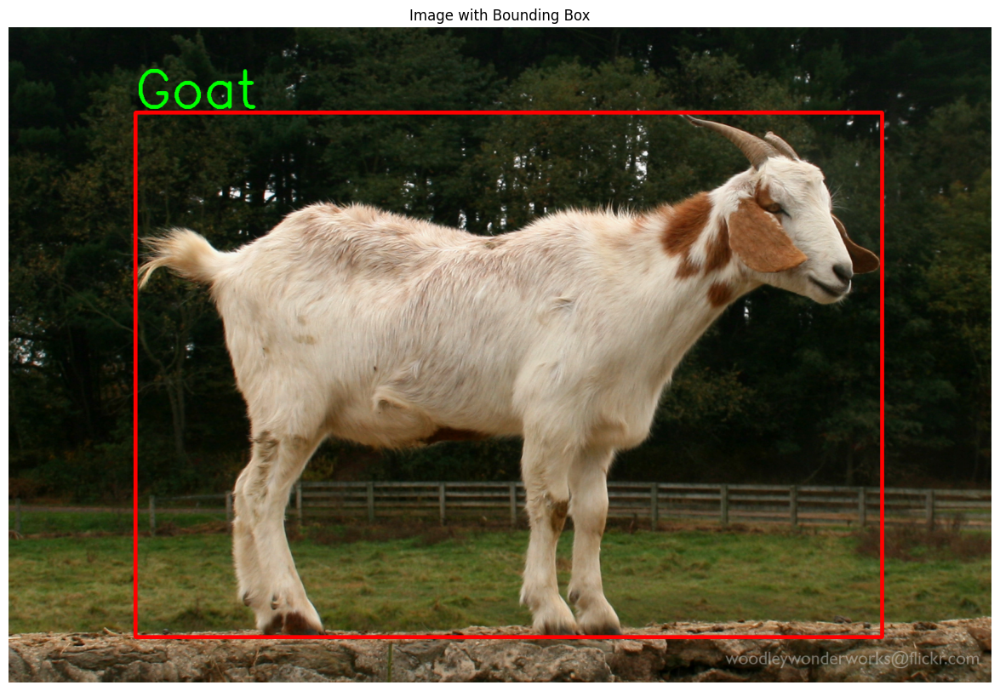

Image: (1200, 1600, 3)
Coordinates: (151, 105), (1469, 1085)


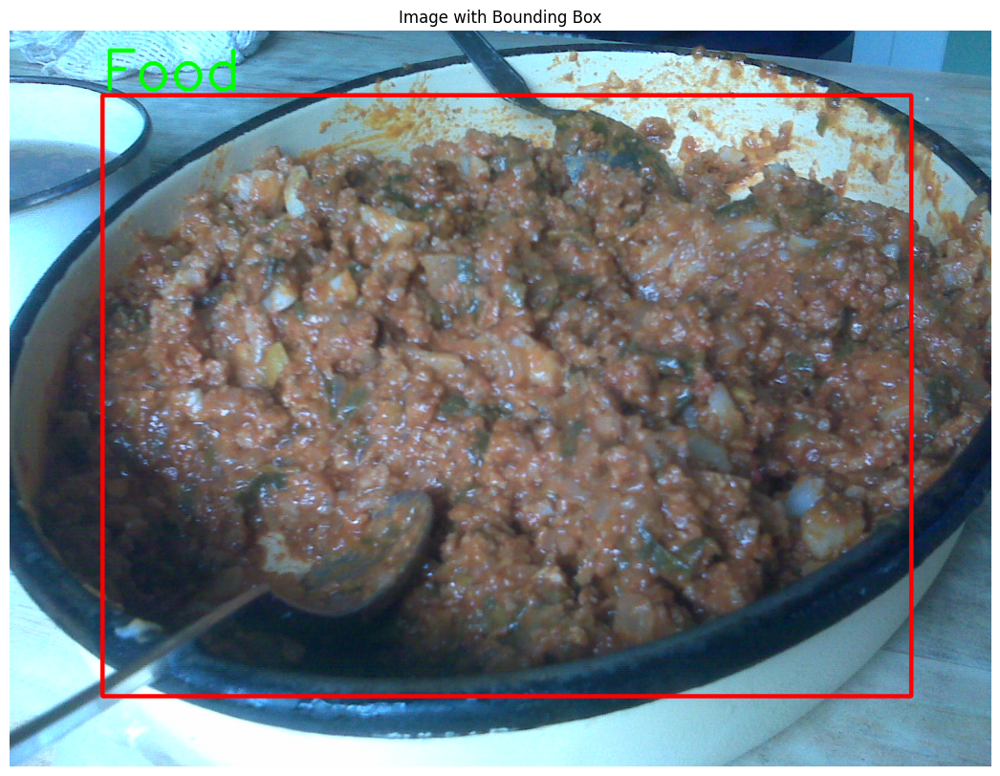

Image: (1696, 2544, 3)
Coordinates: (46, 138), (2462, 1696)


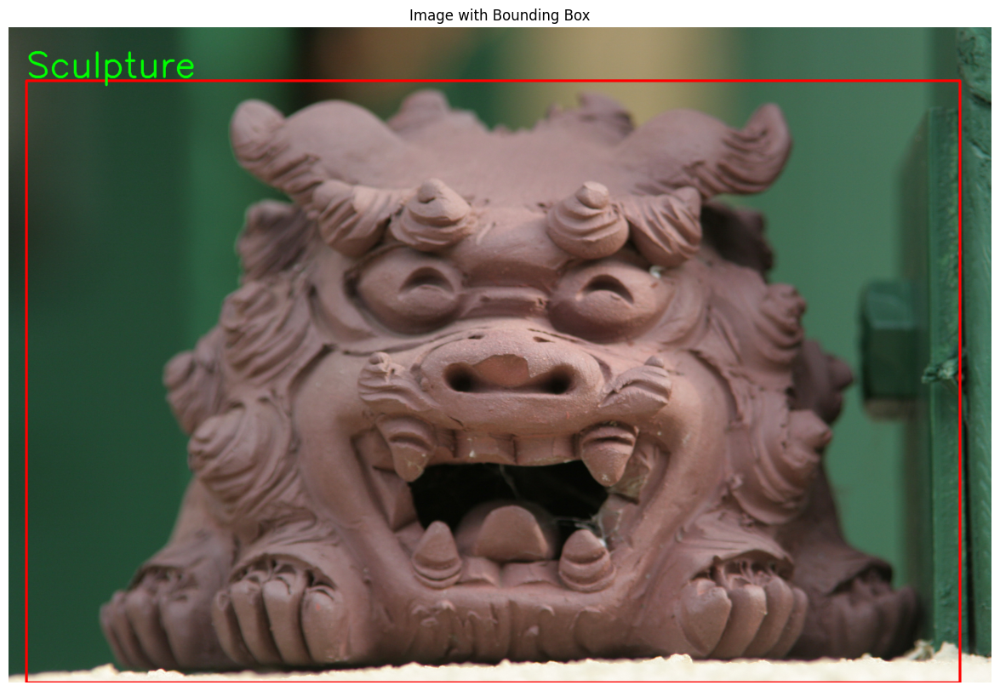

Image: (2848, 4272, 3)
Coordinates: (250, 665), (3842, 2575)


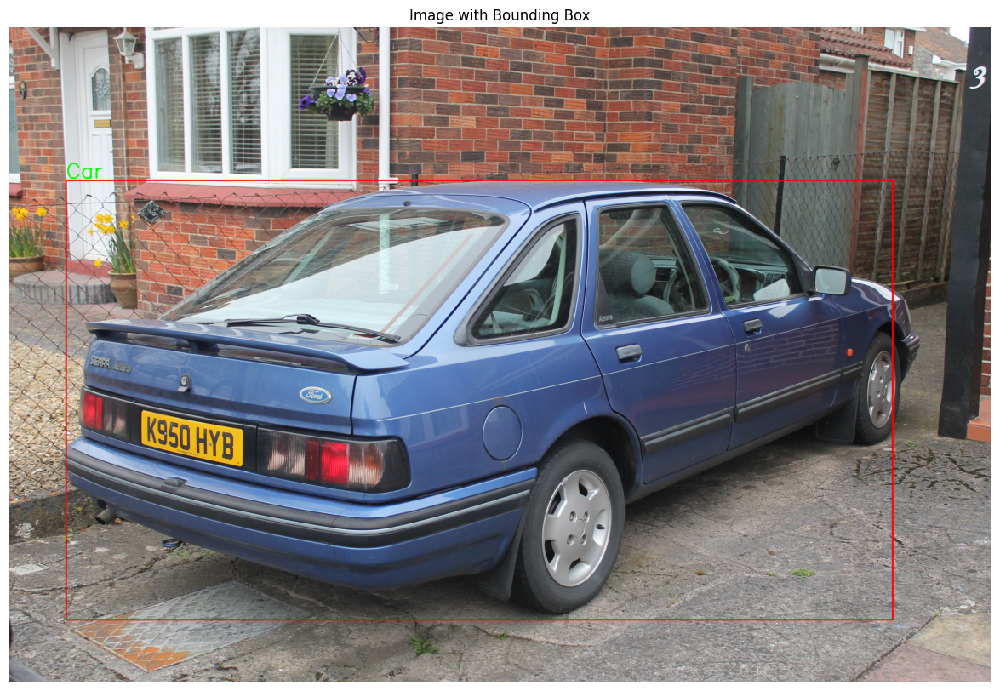

Image: (2500, 2114, 3)
Coordinates: (1967, 1092), (2099, 1193)


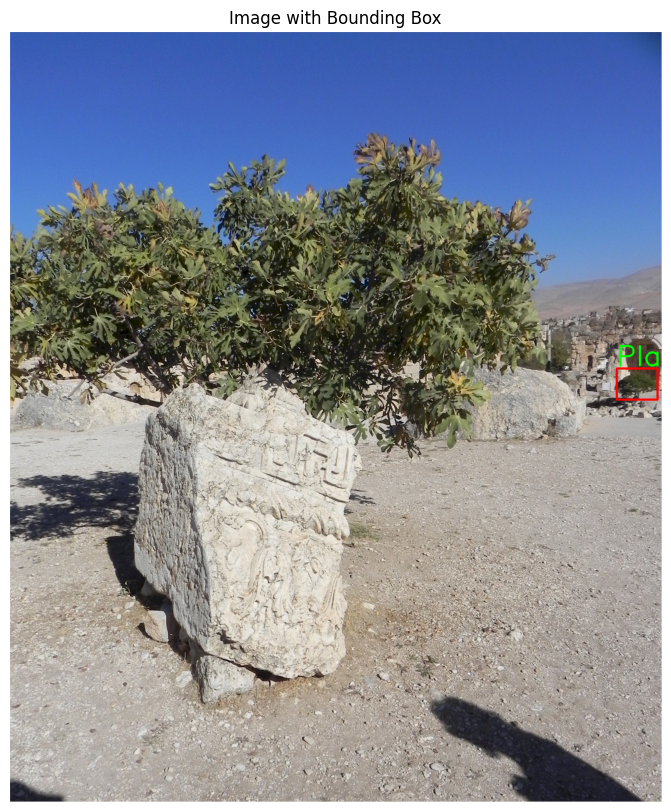

In [38]:
for img_id in random.sample(list(least_objects_img_ids), 5):
    plot_bbox(img_id)

In [40]:
class_descriptions.loc[class_descriptions['ClassName'].isin(['Rocket', 'Potato'])]

,LabelName,ClassName
334,/m/05vtc,Potato
439,/m/09rvcxw,Rocket


In [45]:
rocket_pd = class_descriptions[class_descriptions['ClassName'] == 'Rocket']
potato_pd = class_descriptions[class_descriptions['ClassName'] == 'Potato']

label_name_rocket = rocket_pd['LabelName'].values[0]
label_name_potato = potato_pd['LabelName'].values[0]

**Be careful that there might be several object in one image. For example, there are three person and two mobile phone in one image**

In [46]:
rocket_bbox = annotations_bbox[annotations_bbox['LabelName'] == label_name_rocket]
potato_bbox = annotations_bbox[annotations_bbox['LabelName'] == label_name_potato]

In [47]:
print('There are %d rockets in the dataset' % (len(rocket_bbox)))
print('There are %d potatoes in the dataset' % (len(potato_bbox)))
rocket_img_id = rocket_bbox['ImageID']
potato_img_id = potato_bbox['ImageID']

There are 918 rockets in the dataset
There are 599 potatoes in the dataset


In [48]:
rocket_img_id = np.unique(rocket_img_id)
potato_img_id = np.unique(potato_img_id)

print('There are %d images which contain rockets' % (len(rocket_img_id)))
print('There are %d images which contain potatoes' % (len(potato_img_id)))

There are 638 images which contain rockets
There are 304 images which contain potatoes


In [52]:
sub_rocket_pd = images_boxable.loc[images_boxable['ImageID'].isin(rocket_img_id)]
sub_potato_pd = images_boxable.loc[images_boxable['ImageID'].isin(potato_img_id)]

In [53]:
sub_rocket_dict = sub_rocket_pd[["ImageID", "OriginalURL"]].set_index('ImageID')["OriginalURL"].to_dict()
sub_potato_dict = sub_potato_pd[["ImageID", "OriginalURL"]].set_index('ImageID')["OriginalURL"].to_dict()

In [54]:
mappings = [sub_rocket_dict, sub_potato_dict]

In [55]:
len(mappings)

2

In [56]:
len(mappings[0])

638

In [57]:
classes = ['Rocket', 'Potato']

### Download images

We need to save the images with filename as `image id` with jpg extension

In [31]:
# download images
for idx, obj_type in enumerate(classes):
    n_issues = 0
    # create the directory
    if not os.path.exists(obj_type):
        os.mkdir(obj_type)
    for img_id, url in mappings[idx].items():
        try:
            img = io.imread(url)
            saved_path = os.path.join(obj_type, img_id + ".jpg")
            io.imsave(saved_path, img)
        except Exception as e:
            n_issues += 1
    print(f"Images Issues: {n_issues}")

Images Issues: 18
Images Issues: 1


C:\Users\PC\AppData\Local\Temp\ipykernel_2868\1883154922.py:11: UserWarning: Rocket\73be6f3dc2f92e26.jpg is a low contrast image
  io.imsave(saved_path, img)
C:\Users\PC\AppData\Local\Temp\ipykernel_2868\1883154922.py:11: UserWarning: Rocket\7e9a7357aa0530c6.jpg is a low contrast image
  io.imsave(saved_path, img)
C:\Users\PC\AppData\Local\Temp\ipykernel_2868\1883154922.py:11: UserWarning: Rocket\20fb43c6045f04f1.jpg is a low contrast image
  io.imsave(saved_path, img)


Images Issues: 28
Images Issues: 45


In [84]:
!ls Rocket | wc -l

9


In [ ]:
!ls Potato | wc -l

### Dataset format for Faster-RCNN code

(fname_path, xmin, xmax, ymin, ymax, class_name)

train: 0.8
validation: 0.2

In [33]:
# save images to train and test directory
train_path = 'train'
test_path = 'test'

In [ ]:
!mkdir train test

In [34]:
random.seed(1)

In [35]:
for i in range(len(classes)):
    all_imgs = os.listdir(classes[i])
    all_imgs = [f for f in all_imgs if not f.startswith('.')]
    random.shuffle(all_imgs)

    train_imgs = all_imgs[:int(0.8 * len(all_imgs))]
    test_imgs = all_imgs[int(0.8 * len(all_imgs)):]

    # copy each classes' images to train directory
    for j in range(len(train_imgs)):
        original_path = os.path.join(classes[i], train_imgs[j])
        new_path = os.path.join(train_path, train_imgs[j])
        copyfile(original_path, new_path)

    # copy each classes' images to test directory
    for j in range(len(test_imgs)):
        original_path = os.path.join(classes[i], test_imgs[j])
        new_path = os.path.join(test_path, test_imgs[j])
        copyfile(original_path, new_path)

In [94]:
!ls train | wc -l

23


In [95]:
!ls test | wc -l

3


The expected number of training images and validation images should be 24 and 6 respectively.

However, there might be some overlap images which appear in two or three classes simultaneously. For instance, an image might be a person walking on the street and there are several cars in the street

In [65]:
label_names = [label_name_rocket, label_name_potato]
train_imgs_name = os.listdir(train_path)
train_imgs_name = [name for name in train_imgs_name if not name.startswith('.')]

train_df_headers = ['FileName', 'XMin', 'XMax', 'YMin', 'YMax', 'ClassName']
annotation_bbox_sliced = annotations_bbox[annotations_bbox['LabelName'].isin(label_names)]
class_descriptions.columns = ['LabelName', 'ClassName']
merged_df = pd.merge(annotation_bbox_sliced, class_descriptions, on='LabelName', how='left')
merged_df.rename(columns={'ImageID': 'FileName'}, inplace=True)
merged_df['FileName'] = merged_df['FileName'].apply(lambda x: x + '.jpg')
train_df = merged_df[train_df_headers]
train_df = train_df[train_df['FileName'].isin(train_imgs_name)]

# # Find boxes in each image and put them in a dataframe

for i in range(len(train_imgs_name)):
    sys.stdout.write('Parse train_imgs ' + str(i) + '; Number of boxes: ' + str(len(train_df)) + '\r')
    sys.stdout.flush()
    img_name = train_imgs_name[i]
    img_id = img_name[0:16]
    tmp_df = annotations_bbox[annotations_bbox['ImageID'] == img_id]
    for index, row in tmp_df.iterrows():
        labelName = row['LabelName']
        for i in range(len(label_names)):
            if labelName == label_names[i]:
                train_df = train_df.append(
                    {
                        'FileName': img_name,
                        'XMin': row['XMin'],
                        'XMax': row['XMax'],
                        'YMin': row['YMin'],
                        'YMax': row['YMax'],
                        'ClassName': classes[i]
                    },
                    ignore_index=True)

In [66]:
len(train_imgs_name)

962

In [67]:
train_df.head()

,FileName,XMin,XMax,YMin,YMax,ClassName
0,00013bb4b9ddfbab.jpg,0.256667,0.503333,0.596875,0.820000,Potato
1,00013bb4b9ddfbab.jpg,0.380833,0.999167,0.465625,0.898125,Potato
2,0027f4b3758a5514.jpg,0.235000,0.748750,0.247655,0.478424,Potato
3,0027f4b3758a5514.jpg,0.472500,0.594375,0.250469,0.458724,Potato
4,003e6fd2238e91ab.jpg,0.443715,0.502814,0.051250,0.358750,Rocket


In [69]:
train_df.shape

(1450, 6)

Let's test if they work fine by plotting the bounding box for the above 5 images

In [70]:
train_img_ids = train_df["FileName"].head().str.split(".").str[0].unique()

Image: (3264, 2448, 3)
Coordinates: (1015, 365), (1813, 1213)
Coordinates: (0, 1215), (2445, 3261)
Coordinates: (985, 530), (1821, 1183)
Coordinates: (1091, 314), (1570, 1028)
Coordinates: (0, 140), (1193, 950)
Coordinates: (628, 1948), (1232, 2676)
Coordinates: (932, 1519), (2445, 2931)
Coordinates: (55, 1124), (467, 2127)
Coordinates: (389, 987), (811, 1903)


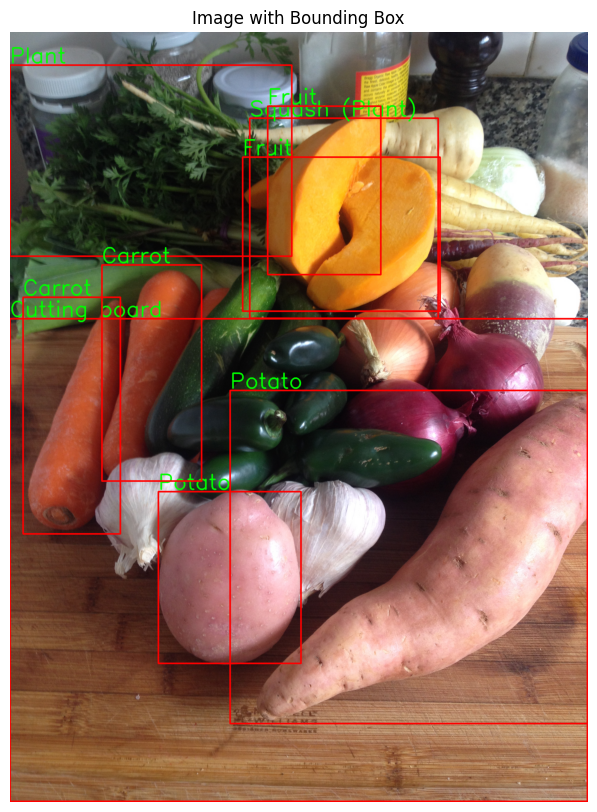

Image: (1333, 2000, 3)
Coordinates: (470, 330), (1497, 637)
Coordinates: (945, 333), (1188, 611)
Coordinates: (707, 686), (1540, 1331)


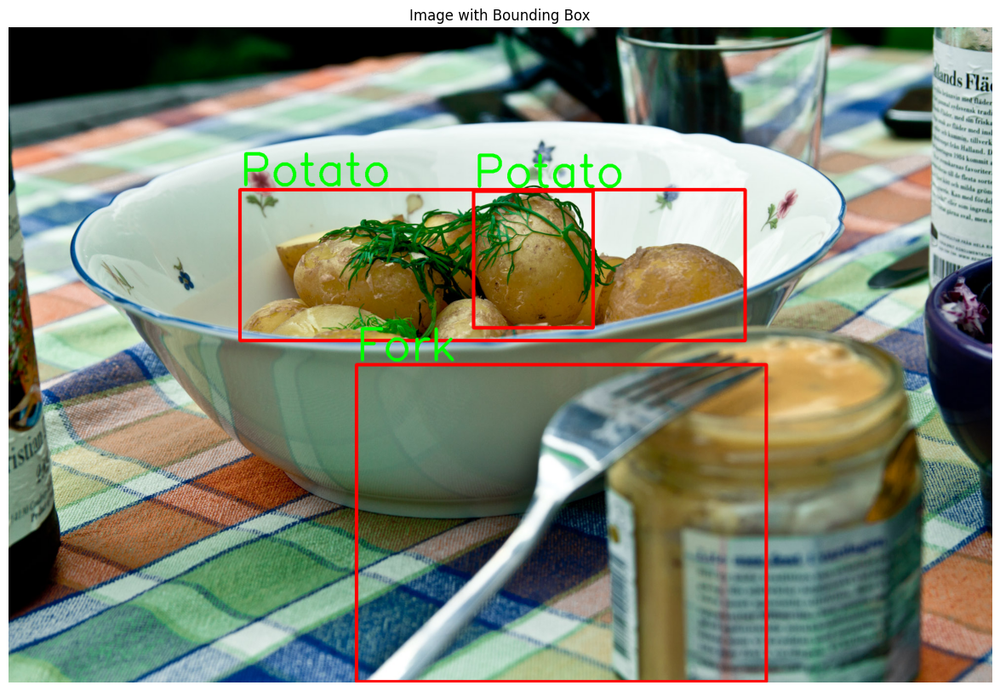

Image: (1969, 1313, 3)
Coordinates: (585, 98), (668, 724)
Coordinates: (582, 100), (660, 706)


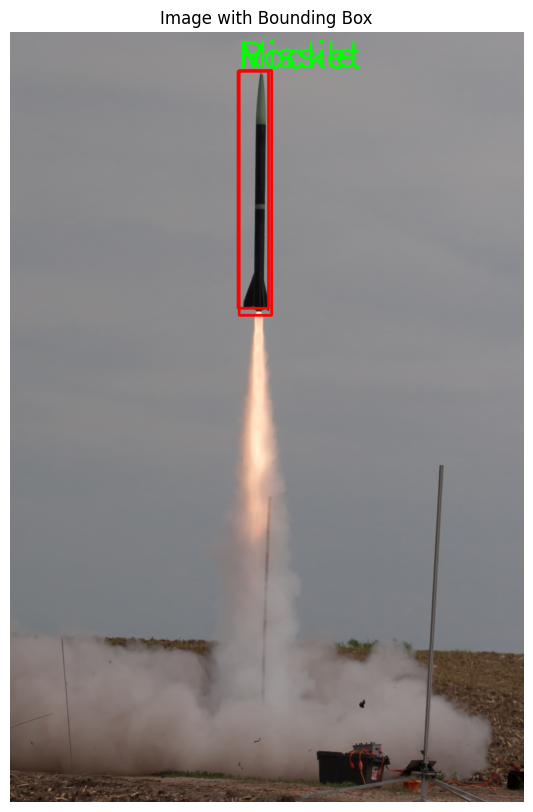

In [76]:
for img_id in train_img_ids:
    plot_bbox(img_id)

**This looks fine to me!!**

In [77]:
label_names = [label_name_rocket, label_name_potato]
test_imgs_name = os.listdir(test_path)
test_imgs_name = [name for name in test_imgs_name if not name.startswith('.')]

test_df_headers = ['FileName', 'XMin', 'XMax', 'YMin', 'YMax', 'ClassName']
annotation_bbox_sliced = annotations_bbox[annotations_bbox['LabelName'].isin(label_names)]
class_descriptions.columns = ['LabelName', 'ClassName']

merged_df = pd.merge(annotation_bbox_sliced, class_descriptions, on='LabelName', how='left')
merged_df.rename(columns={'ImageID': 'FileName'}, inplace=True)
merged_df['FileName'] = merged_df['FileName'].apply(lambda x: x + '.jpg')

test_df = merged_df[test_df_headers]
test_df = test_df[test_df['FileName'].isin(test_imgs_name)]

In [79]:
test_df.shape

(367, 6)

In [78]:
train_df.to_csv('train.csv')
test_df.to_csv('test.csv')

### Write train.csv to annotation.txt

In [82]:
train_df = pd.read_csv('train.csv')

# for training
with open("annotation.txt", "w+") as f:
    for idx, row in train_df.iterrows():
        img = cv2.imread('train/' + row['FileName'])
        if img is None:
            print('Could not find image: ' + row['FileName'])
            continue

        height, width = img.shape[:2]
        x1 = int(row['XMin'] * width)
        x2 = int(row['XMax'] * width)
        y1 = int(row['YMin'] * height)
        y2 = int(row['YMax'] * height)

        file_path = 'train/'
        fileName = os.path.join(file_path, row['FileName'])
        className = row['ClassName']
        f.write(fileName + ',' + str(x1) + ',' + str(y1) + ',' + str(x2) + ',' + str(y2) + ',' + className + '\n')

In [83]:
test_df = pd.read_csv('test.csv')

# for test
with open("test_annotation.txt", "w+") as f:
    for idx, row in test_df.iterrows():
        sys.stdout.write(str(idx) + '\r')
        sys.stdout.flush()
        img = cv2.imread('test/' + row['FileName'])
        height, width = img.shape[:2]
        x1 = int(row['XMin'] * width)
        x2 = int(row['XMax'] * width)
        y1 = int(row['YMin'] * height)
        y2 = int(row['YMax'] * height)

        file_path = '/test'
        fileName = os.path.join(file_path, row['FileName'])
        className = row['ClassName']
        f.write(fileName + ',' + str(x1) + ',' + str(y1) + ',' + str(x2) + ',' + str(y2) + ',' + className + '\n')